In [22]:
import numpy as np
from PIL import Image, ImageOps, ImageEnhance
import pylab

In [23]:
im = Image.open('trees/IMG_E0457.JPG')


In [24]:
im_inv = ImageOps.invert(im)

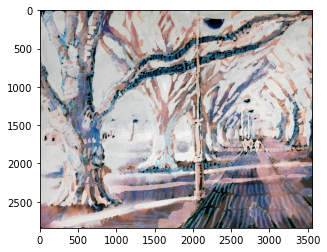

In [25]:
pylab.imshow(im_inv)

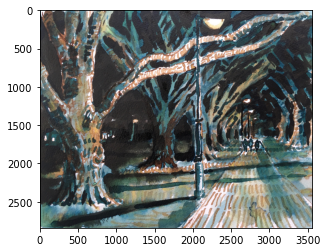

In [26]:
br = ImageEnhance.Brightness(im)
co = ImageEnhance.Contrast(im)
pylab.imshow(im)

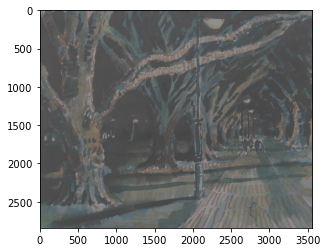

In [27]:
im_lowc = co.enhance(0.3)
pylab.imshow(im_lowc)

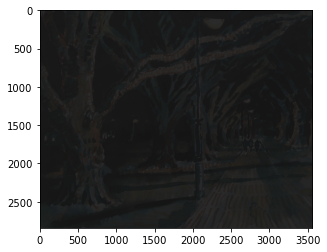

In [28]:
im_lowc_lowb = (ImageEnhance.Brightness(im_lowc)).enhance(0.3)
pylab.imshow(im_lowc_lowb)

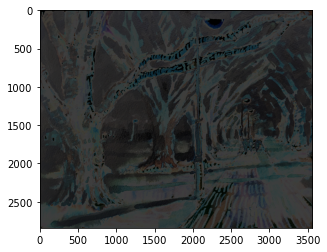

In [9]:
im_arr, im_inv_arr = np.asarray(im).astype(float)/255, np.asarray(im_inv).astype(float)/255
im_dark_arr = (255*im_arr*im_inv_arr).astype('uint8')
im_dark = Image.fromarray(im_dark_arr)
pylab.imshow(im_dark)
im_dark.save('IMG_E0457_dark.JPG')

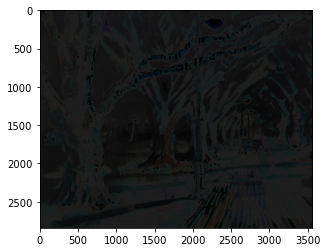

In [10]:
br = ImageEnhance.Brightness(im_dark)
im_darker=br.enhance(0.5)
pylab.imshow(im_darker)
#pylab.imshow(im_dark)

In [11]:
im_darker.save('IMG_E0457_darker.JPG')

In [12]:
br = ImageEnhance.Brightness(im_dark)
im_darker=br.enhance(0.2)
im_darker.save('IMG_E0457_very_dark.JPG')

In [13]:
from moviepy.editor import *

In [14]:
width=500
clip_0 = ImageClip(np.asarray(im),duration=2)
clip_0 = clip_0.resize(width=width)
clip_1 = ImageClip(np.asarray(im_inv),duration=2)
clip_1 = clip_1.resize(width=width)
print(type(clip_1))
print(clip_1.duration)

<class 'moviepy.video.VideoClip.ImageClip'>
2


In [15]:
vocals = AudioFileClip("Vocals Seeing the Big Picture.mp3")
print(vocals.duration)
print(vocals.get_frame(3.))

94.03999999999999
[0.00463867 0.00085449]


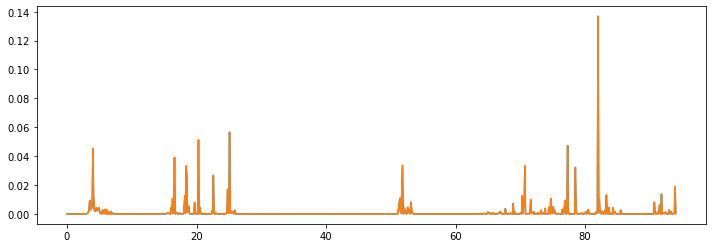

In [16]:
ts = np.arange(0,vocals.duration,0.1)
vocal_frames = np.array([vocals.get_frame(t) for t in ts])
import pylab
fig,ax=pylab.subplots(figsize=(12,4))

vol = (vocal_frames**2).sum(axis=1)
ax.plot(ts,vol)
ax.plot(ts,vol)
vocal_frames_1 = vocal_frames[:,0]

In [17]:
def flicker(im_light, im_dark, duration=0.1):
    clip_light = ImageClip(np.asarray(im_light),duration=duration)
    clip_dark = ImageClip(np.asarray(im_dark),duration=duration)
    return concatenate_videoclips([clip_light,clip_dark], method='compose')

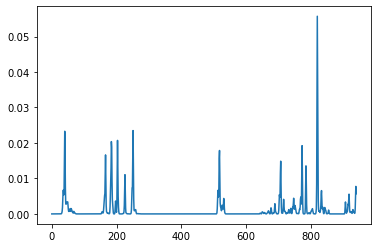

In [18]:
delta_t = 0.1
ts = np.arange(0,vocals.duration,0.1)
vocal_frames = np.array([vocals.get_frame(t) for t in ts])
vols = (vocal_frames**2).sum(axis=1)
from scipy.ndimage import gaussian_filter1d

vol_norm = (vols**0.5)/(vols**0.5).max()
#pylab.plot(vol_norm)
vol_smooth = gaussian_filter1d(vols,1)
pylab.plot(vol_smooth)


In [29]:
p_flicker=0.1
do_flicker = np.random.random(len(ts))<p_flicker
t_flicker = ts[do_flicker]

clip_light = ImageClip(np.asarray(im),duration=0.1).resize(width=500)
clip_dark = ImageClip(np.asarray(im_darker),duration=0.1).resize(width=500)
flicker = concatenate_videoclips([clip_light,clip_dark,clip_light], method='compose')

clips = []
start_im = np.asarray(im_darker)
t0=0.

for i,t in enumerate(t_flicker):
    if t0>t:
        continue
    clips.append(clip_dark.set_duration(t-t0))
    clips.append(flicker)
    t0 = t+flicker.duration

final_clip = concatenate_videoclips(clips, method='compose')
final_clip=final_clip.set_audio(vocals)
final_clip.ipython_display(fps=20, loop=True, autoplay=True,audio=True,codec='mpeg4',
                          maxduration=300)

chunk:   2%|▏         | 33/2074 [00:00<00:07, 276.09it/s, now=None]

Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


t:   1%|          | 11/1878 [00:00<00:18, 101.23it/s, now=None]       

MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [21]:
br = vol_smooth/vol_smooth.max()
br[br<0.1] = 0.
print(br.max()) 

1.0
